          IMAGE FEATURE MATCHING SYSTEM

Processing Image Pair 1
Image 1 Keypoints : 500
Image 2 Keypoints : 500
Total Matches : 133
Good Matches  : 14


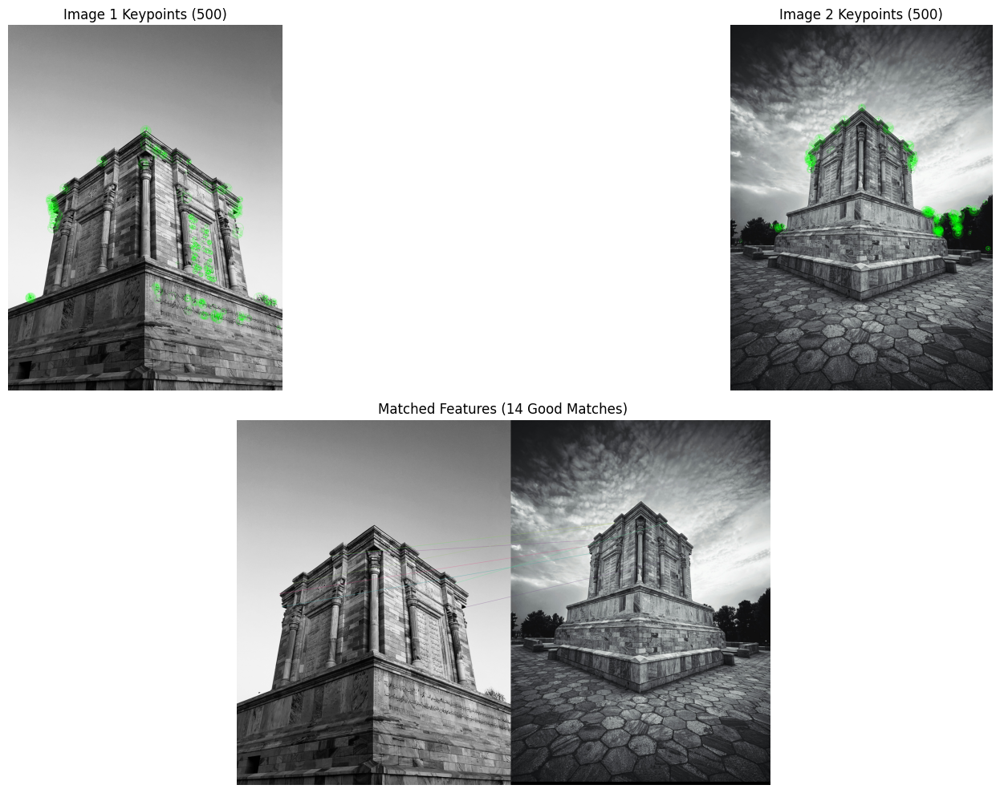


Processing Image Pair 2
Image 1 Keypoints : 275
Image 2 Keypoints : 500
Total Matches : 60
Good Matches  : 14


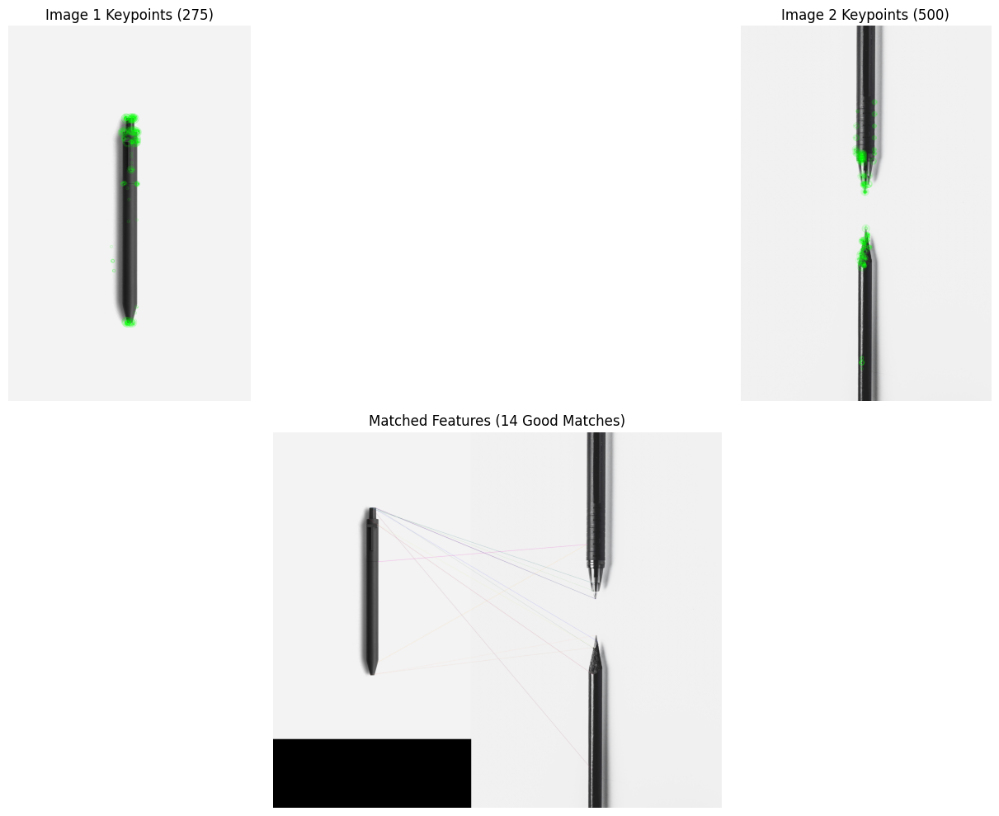


Processing Image Pair 3
Image 1 Keypoints : 500
Image 2 Keypoints : 500
Total Matches : 130
Good Matches  : 2


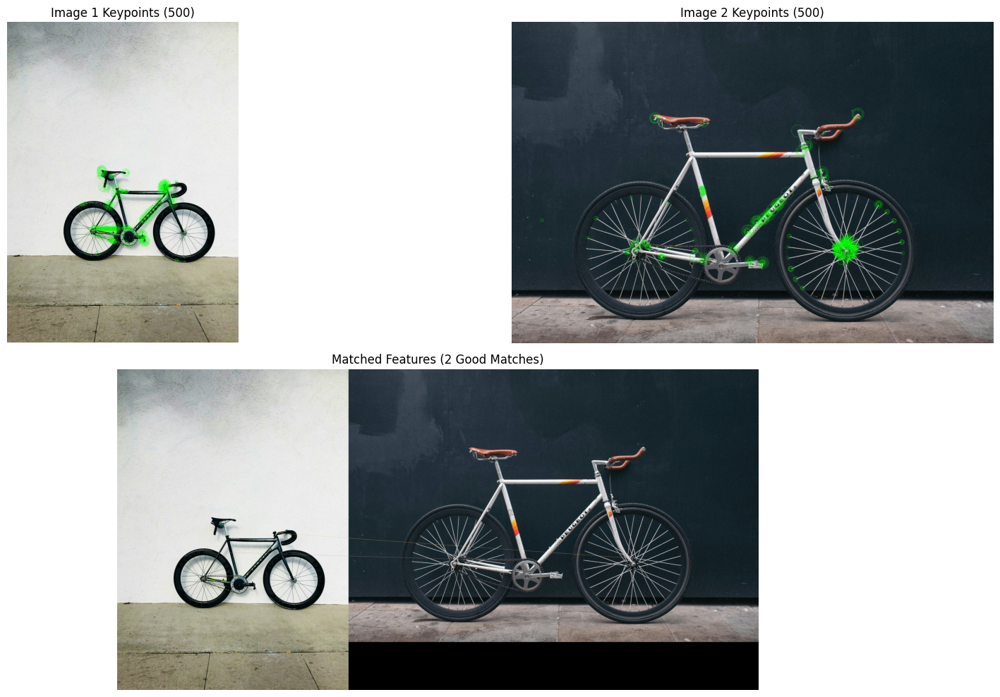


Processing Image Pair 4
Image 1 Keypoints : 500
Image 2 Keypoints : 314
Total Matches : 91
Good Matches  : 12


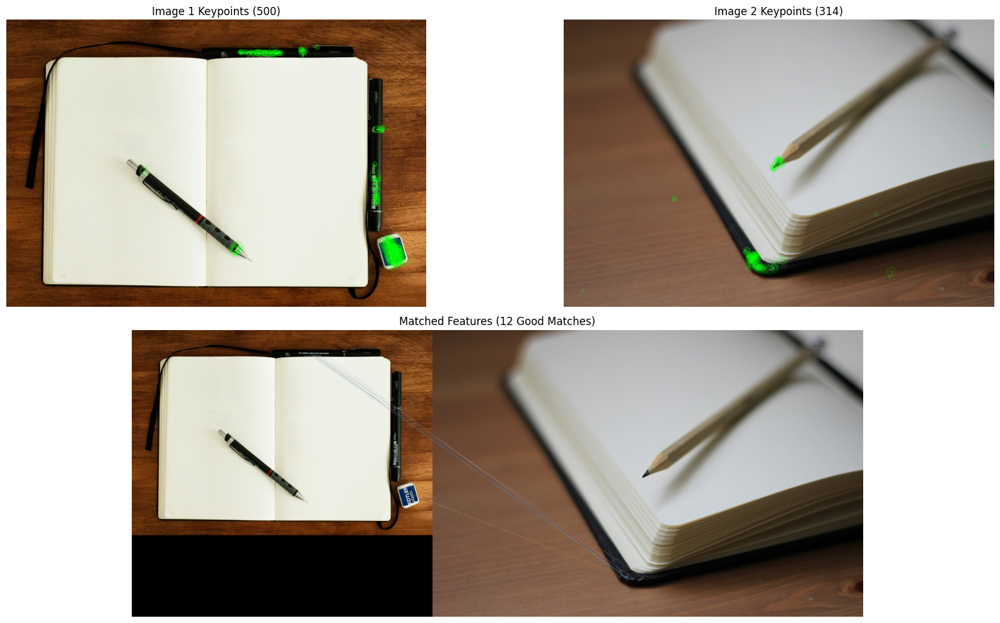


Processing Image Pair 5
Image 1 Keypoints : 500
Image 2 Keypoints : 500
Total Matches : 92
Good Matches  : 16


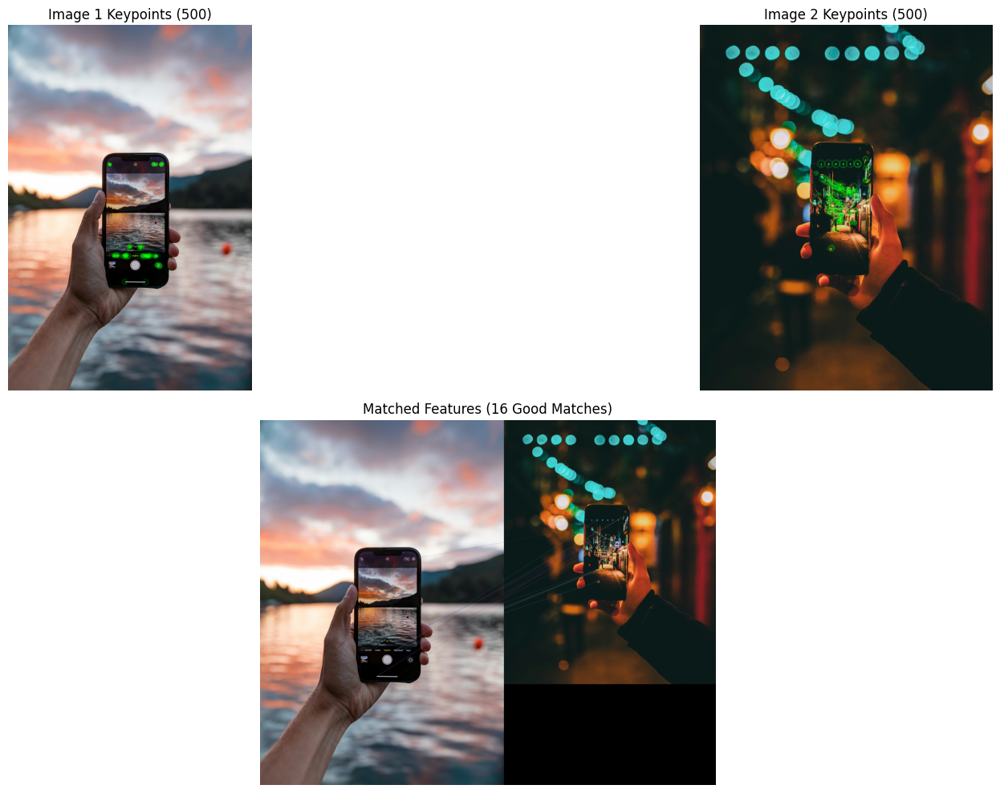


Processing Image Pair 6
Image 1 Keypoints : 500
Image 2 Keypoints : 500
Total Matches : 144
Good Matches  : 58


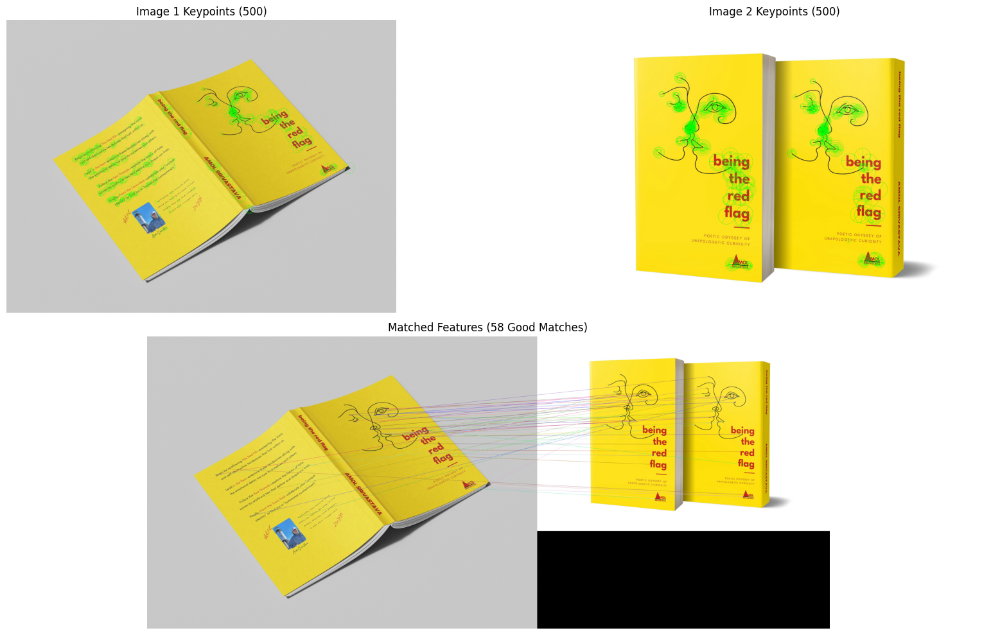


Processing Image Pair 7
Image 1 Keypoints : 500
Image 2 Keypoints : 500
Total Matches : 71
Good Matches  : 12


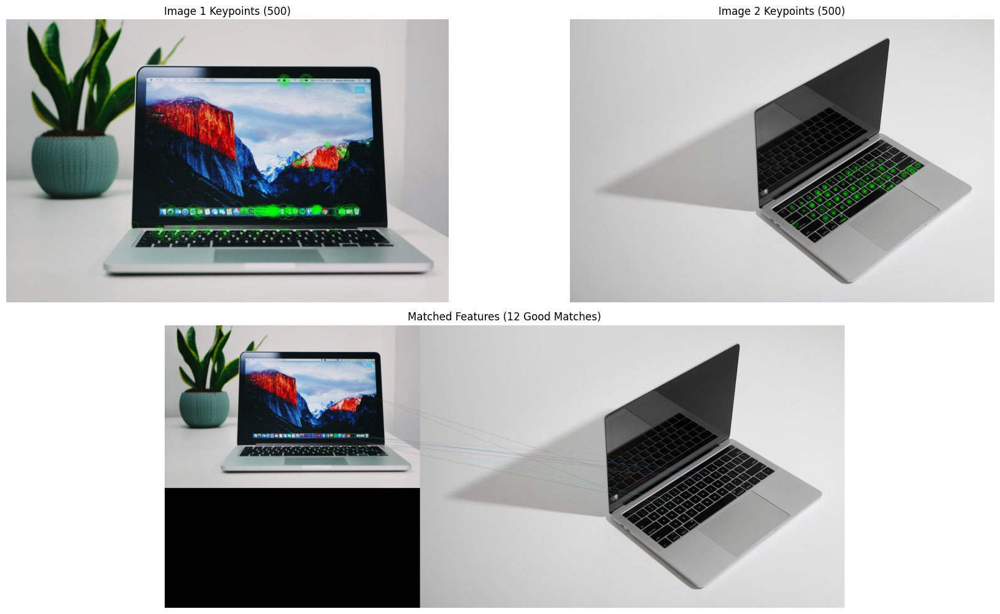


Processing Image Pair 8
Image 1 Keypoints : 500
Image 2 Keypoints : 500
Total Matches : 83
Good Matches  : 69


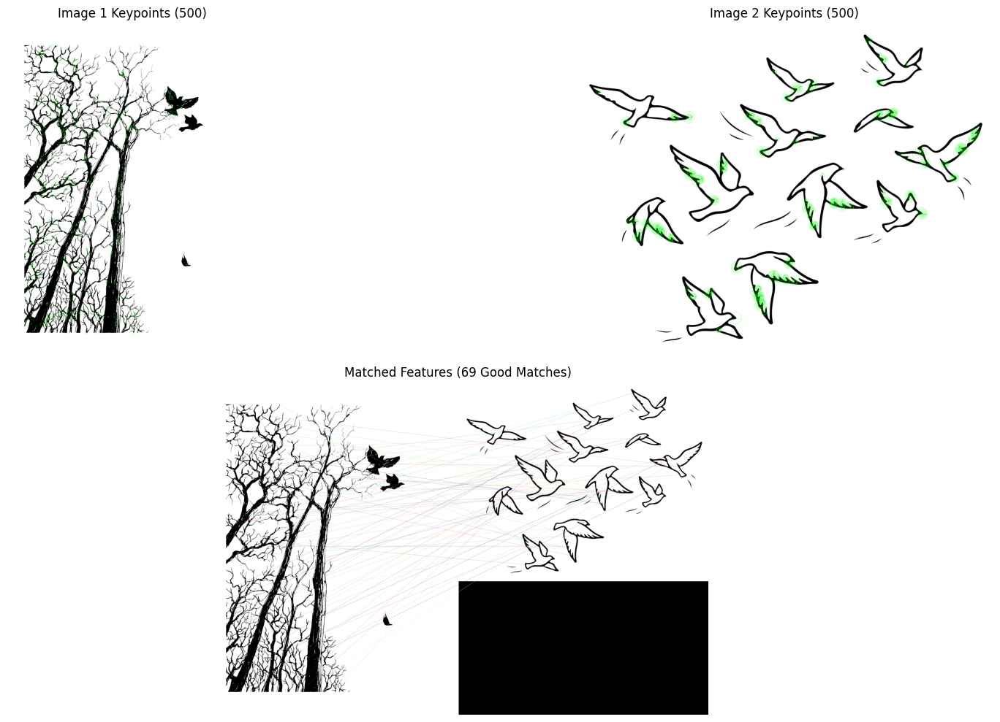


Processing Image Pair 9
Image 1 Keypoints : 500
Image 2 Keypoints : 500
Total Matches : 138
Good Matches  : 3


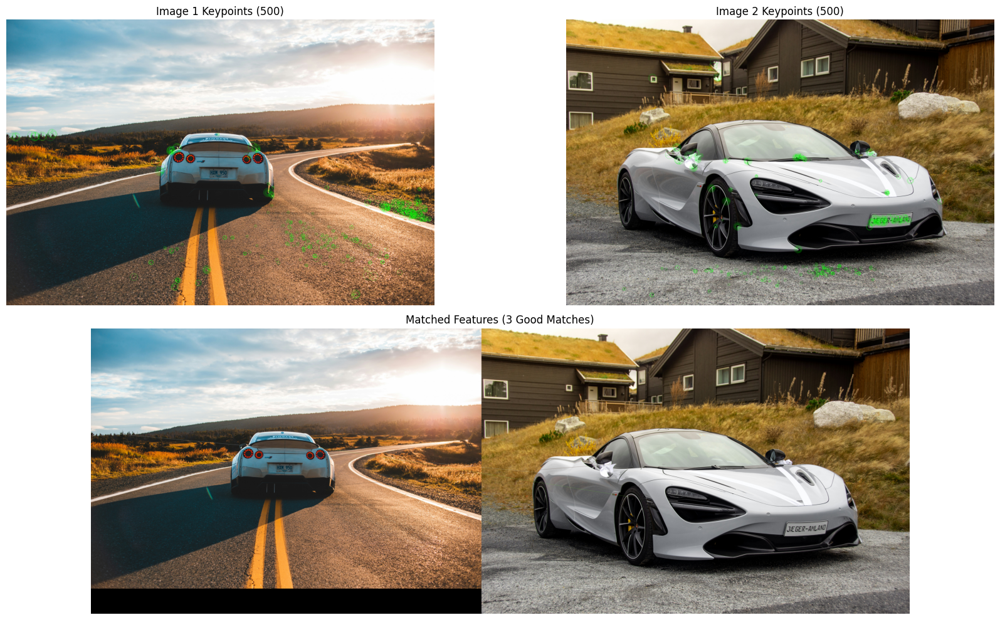


Processing Image Pair 10
Image 1 Keypoints : 500
Image 2 Keypoints : 500
Total Matches : 117
Good Matches  : 25


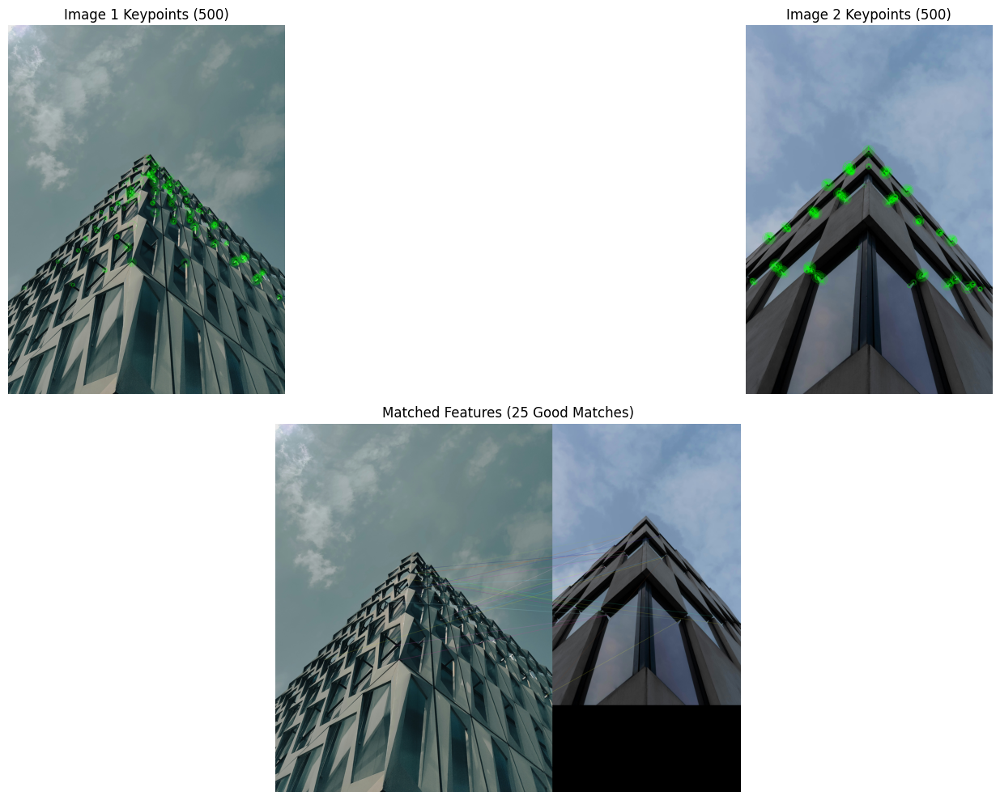


All image pairs processed successfully.


In [6]:
import cv2
import matplotlib.pyplot as plt
import os

# ===========================================
# IMAGE FEATURE MATCHING SYSTEM USING ORB
# ===========================================

print("=" * 70)
print("          IMAGE FEATURE MATCHING SYSTEM")
print("=" * 70)

# Create ORB detector
orb = cv2.ORB_create()

os.makedirs("output", exist_ok=True)
# Loop through all 10 image pairs
for i in range(1, 11):

    print("\n" + "=" * 70)
    print(f"Processing Image Pair {i}")
    print("=" * 70)

    # ---------------------------------------
    # Image Paths
    # ---------------------------------------

    image1_path = f"images/pair{i}_a.jpg"
    image2_path = f"images/pair{i}_b.jpg"

    # ---------------------------------------
    # Read Images
    # ---------------------------------------

    img1 = cv2.imread(image1_path)
    img2 = cv2.imread(image2_path)

    if img1 is None or img2 is None:
        print("Could not load one or both images.")
        continue

    # ---------------------------------------
    # Convert Images
    # ---------------------------------------

    img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # ---------------------------------------
    # Detect ORB Keypoints
    # ---------------------------------------

    kp1, des1 = orb.detectAndCompute(gray1, None)
    kp2, des2 = orb.detectAndCompute(gray2, None)

    print(f"Image 1 Keypoints : {len(kp1)}")
    print(f"Image 2 Keypoints : {len(kp2)}")

    # ---------------------------------------
    # Draw Keypoints
    # ---------------------------------------

    img1_keypoints = cv2.drawKeypoints(
        img1_rgb,
        kp1,
        None,
        color=(0,255,0),
        flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS
    )

    img2_keypoints = cv2.drawKeypoints(
        img2_rgb,
        kp2,
        None,
        color=(0,255,0),
        flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS
    )

    # ---------------------------------------
    # Match Features
    # ---------------------------------------

    if des1 is None or des2 is None:
        print("Descriptors could not be computed.")
        continue

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

    matches = bf.match(des1, des2)

    matches = sorted(matches, key=lambda x: x.distance)

    # ---------------------------------------
    # Good Match Filtering
    # ---------------------------------------

    threshold = 50

    good_matches = [m for m in matches if m.distance < threshold]

    print(f"Total Matches : {len(matches)}")
    print(f"Good Matches  : {len(good_matches)}")

    # ---------------------------------------
    # Draw Matched Features
    # ---------------------------------------

    matched_image = cv2.drawMatches(
        img1_rgb,
        kp1,
        img2_rgb,
        kp2,
        good_matches,
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )

    # Save matched image
    matched_bgr = cv2.cvtColor(matched_image, cv2.COLOR_RGB2BGR)
    cv2.imwrite(f"output/pair{i}_matched.jpg", matched_bgr)

    # ---------------------------------------
    # Display Results
    # ---------------------------------------

    plt.figure(figsize=(18,10))

    plt.subplot(2,2,1)
    plt.imshow(img1_keypoints)
    plt.title(f"Image 1 Keypoints ({len(kp1)})")
    plt.axis("off")

    plt.subplot(2,2,2)
    plt.imshow(img2_keypoints)
    plt.title(f"Image 2 Keypoints ({len(kp2)})")
    plt.axis("off")

    plt.subplot(2,1,2)
    plt.imshow(matched_image)
    plt.title(f"Matched Features ({len(good_matches)} Good Matches)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

print("\n" + "=" * 70)
print("All image pairs processed successfully.")
print("=" * 70)